In [1]:
!pip install transformers torch datasets

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.0/542.0 kB 5.6 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.19.3-py3-none-manylinux1_x86_64.whl (166.0 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-many

In [3]:
from datasets import load_dataset

data = load_dataset(
    "jamescalam/image-text-demo",
    split="train"
)

data


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


Generating train split:   0%|          | 0/21 [00:00<?, ? examples/s]

Dataset({
    features: ['text', 'image'],
    num_rows: 21
})

In [6]:
data[1]['text']

'aerial shot of modern city at sunrise'

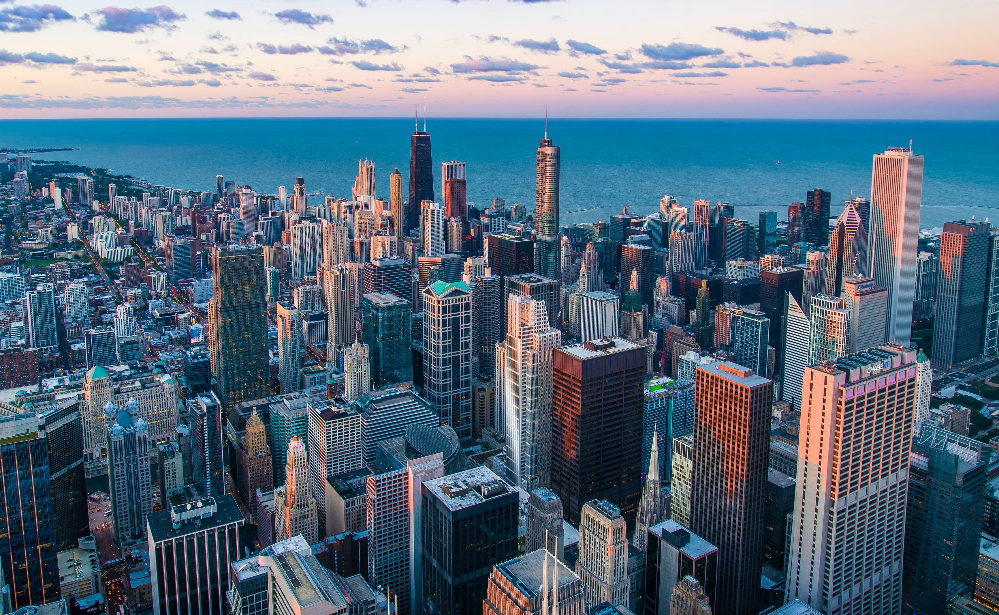

In [7]:
data[1]['image']

In [8]:
from transformers import CLIPProcessor, CLIPModel
import torch

model_id = "openai/clip-vit-base-patch32"

processor = CLIPProcessor.from_pretrained(model_id)
model = CLIPModel.from_pretrained(model_id)

# move model to device if possible

device = 'cuda' if torch.cuda.is_available() else 'cpu'

model.to(device)
print(device)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/file_download.py:1132: FutureWarning: `resume_download` is deprecated and will be removed in version 1.0.0. Downloads always resume when possible. If you want to force a new download, use `force_download=True`.
  warnings.warn(


preprocessor_config.json:   0%|          | 0.00/316 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/592 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/862k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/525k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/2.22M [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/389 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

cpu


Encoding Text

In [9]:
text = data['text']

tokens = processor(
    text = text,
    padding = True,
    images = None,
    return_tensors = 'pt'
).to(device)
tokens.keys()

dict_keys(['input_ids', 'attention_mask'])

In [ ]:
# input_ids : human understandable text to model understandable ids
# padding : input sequence pre-defined hence padding labels [PAD] [PAD] [PAD] will be added to create equal input sequence length from varied length text input

In [10]:
tokens['input_ids']

tensor([[49406, 12440,  2000,   539, 30987,  1305,   593,  3638, 31808, 49407,
         49407, 49407, 49407, 49407, 49407],
        [49406, 12440,  2000,   539,  4077,  1305,   536,  5610, 49407, 49407,
         49407, 49407, 49407, 49407, 49407],
        [49406,  9738,  8292,   525,   518,  8231,   539,   320,  2368, 49407,
         49407, 49407, 49407, 49407, 49407],
        [49406,  2242, 13063,  3941,  1417,  1538,  5922, 49407, 49407, 49407,
         49407, 49407, 49407, 49407, 49407],
        [49406, 17054,  1929, 21021,   620, 13626,   593,  4481,  5994, 49407,
         49407, 49407, 49407, 49407, 49407],
        [49406, 30987,  1305,   593,   912,  4350,  4730, 10113, 49407, 49407,
         49407, 49407, 49407, 49407, 49407],
        [49406, 30987,  6682,  1305,  2012,   953,  2443,   593,   736,   537,
          1746,  3073, 49407, 49407, 49407],
        [49406,  9718, 22192,  2368,   593,  1538,  6024,  2880, 11160,   525,
          9057,  2175, 49407, 49407, 49407],
        

In [ ]:
# 49407 - Padding token id | 49406 - initialization token or start token

In [11]:
tokens['attention_mask']

tensor([[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0],
        [1, 1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0],
        [1

In [ ]:
# 1 - words we gave | 0 - tokens preprocessor added

In [12]:
text_emb = model.get_text_features(**tokens.to(device)) # CLIP encodes the input sequences to vector space
print(text_emb.shape)
print(text_emb.min(), text_emb.max())

torch.Size([21, 512])
tensor(-1.1893, grad_fn=<MinBackward1>) tensor(4.8015, grad_fn=<MaxBackward1>)


21 vectors of 512 dimensions. We must also normalize these values if using dot product similarity(not needed for cosine similarity), we do this with Numpy

In [13]:
import numpy as np

# detach text emb from graph, move to CPU, and convert to numpy array
text_emb = text_emb.detach().cpu().numpy()

# calculate value to normalize each vector by
norm_factor = np.linalg.norm(text_emb, axis = 1)
norm_factor.shape

(21,)

In [14]:
text_emb = text_emb.T / np.linalg.norm(text_emb, axis = 1)
# transpose back to (21, 512)
text_emb = text_emb.T
print(text_emb.shape)
print(text_emb.min(), text_emb.max())

(21, 512)
-0.15268457 0.534499


Encoding Images

Images are preprocessed using the processor too, but using slightly different parameters

In [15]:
data['image'][0].size

(6000, 3376)

In [ ]:
# CLIP expects a predefined size of image and also expects a normalized values in those pixels

In [16]:
image_batch = data['image']

images = processor(
    text = None,
    images = image_batch,
    return_tensors = 'pt'
)['pixel_values'].to(device)
images.shape

torch.Size([21, 3, 224, 224])

In [17]:
img_emb = model.get_image_features(images)
print(img_emb.shape)
print(img_emb.min(), img_emb.max())

torch.Size([21, 512])
tensor(-8.6561, grad_fn=<MinBackward1>) tensor(2.6768, grad_fn=<MaxBackward1>)


In [18]:
# normalizing these vectors as well

# detach text emb from graph, move to CPU, and convert to numpy array
img_emb = img_emb.detach().cpu().numpy()

img_emb = img_emb.T / np.linalg.norm(img_emb, axis = 1)

# transpose back to (21, 512)

img_emb = img_emb.T
print(img_emb.shape)
print(img_emb.min(), img_emb.max())

(21, 512)
-0.7277219 0.2359628


Calculating similarity

With image and text embeddings built, we can use a similarity metric like cosine similarity or dot product similarity to find the most similar items.

In [19]:
from numpy.linalg import norm

cos_sim = np.dot(text_emb, img_emb.T) / (norm(text_emb, axis=1) * norm(img_emb, axis = 1))
cos_sim.shape

(21, 21)

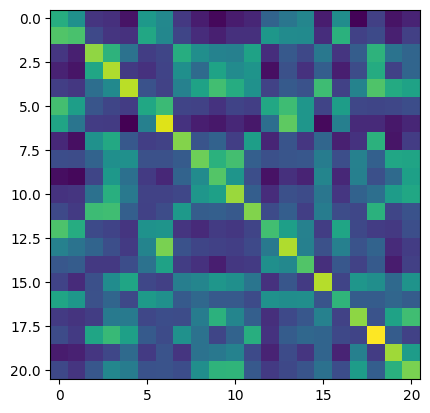

In [20]:
# Visualizing

import matplotlib.pyplot as plt

plt.imshow(cos_sim)
plt.show()

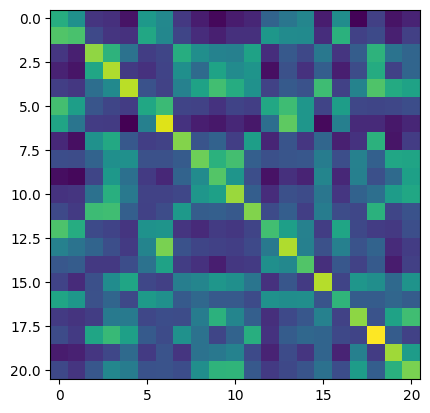

In [21]:
dot_sim = np.dot(text_emb, img_emb.T)
plt.imshow(dot_sim)
plt.show()

In [22]:
diff = cos_sim - dot_sim
diff.min(), diff.max()

(0.0, 2.9802322e-08)